In [1]:
# unicode, regex, json for text digestion
import unicodedata
import re
import json
from wordcloud import WordCloud

import seaborn as sns
import matplotlib.pyplot as plt

# nltk: natural language toolkit -> tokenization, stopwords (more on this soon)
import nltk
from nltk.tokenize.toktok import ToktokTokenizer
from nltk.corpus import stopwords

from prepare import *


# pandas dataframe manipulation, acquire script, time formatting
import pandas as pd
from time import strftime

# shh, down in front
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_json('data.json')

In [3]:
df = prep_repos(df)

In [4]:
df

,repo,language,original,clean,stemmed,lemmatized
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github starshttps imgshieldsio github stars di...,github starshttp imgshieldsio github star digi...,github starshttps imgshieldsio github star dig...
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logoflutterdev build status cirrusbuil...,flutter logoflutterdev build statu cirrusbuild...,flutter logoflutterdev build status cirrusbuil...
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...
...,...,...,...,...,...,...
104,cloudflare/cloudflare.github.io,CSS,cloudflare.github.io\n====================\n\n...,cloudflaregithubio source code https cloudflar...,cloudflaregithubio sourc code http cloudflareg...,cloudflaregithubio source code http cloudflare...
105,eleme/eleme.github.io,CSS,# Team Blog\n\nRequirements to join this blog:...,team blog requirements join blog 1 must develo...,team blog requir join blog 1 must develop elem...,team blog requirement join blog 1 must develop...
106,didi/didi.github.io,HTML,# didi.github.io\ndidi website\n,didigithubio didi website,didigithubio didi websit,didigithubio didi website
107,alibaba/alibaba.github.com,CSS,,,,


In [5]:
df[df.language.isna()]

,repo,language,original,clean,stemmed,lemmatized
6,felipefialho/frontend-challenges,None,"<p align=""center""><img src=""https://user-image...",p aligncenterimg srchttps userimagesgithubuser...,p aligncenterimg srchttp userimagesgithubuserc...,p aligncenterimg srchttps userimagesgithubuser...
8,florinpop17/app-ideas,None,## :ledger: App Ideas Collection\n\n![App Idea...,ledger app ideas collection app ideas image ap...,ledger app idea collect app idea imag appideas...,ledger app idea collection app idea image appi...
21,ACM-Alexandria-SC/Internships,None,\n\n\n\n# Summer 2022 Tech Internships for Egy...,summer 2022 tech internships egyptian students...,summer 2022 tech internship egyptian student c...,summer 2022 tech internship egyptian student c...
36,onceupon/Bash-Oneliner,None,# Bash-Oneliner\nI am glad that you are here! ...,bashoneliner glad working bioinformatics years...,bashonelin glad work bioinformat year ago amaz...,bashoneliner glad working bioinformatics year ...
75,datasciencemasters/go,None,_created & maintained by [@clarecorthell](http...,created maintained clarecorthellhttp bitly cla...,creat maintain clarecorthellhttp bitli clareco...,created maintained clarecorthellhttp bitly cla...
76,practical-tutorials/project-based-learning,None,# Project Based Learning\n\n[![Gitter](https:/...,project based learning gitterhttps badgesgitte...,project base learn gitterhttp badgesgitterim p...,project based learning gitterhttps badgesgitte...
77,zhiwehu/Python-programming-exercises,None,# Python-programming-exercises\n\n100+ Python ...,pythonprogrammingexercises 100 python challeng...,pythonprogrammingexercis 100 python challeng p...,pythonprogrammingexercises 100 python challeng...
78,MunGell/awesome-for-beginners,None,[![Doppler](assets/doppler.png)](https://www.d...,dopplerassets dopplerpnghttps wwwdopplercom ut...,dopplerasset dopplerpnghttp wwwdopplercom utmc...,dopplerassets dopplerpnghttps wwwdopplercom ut...
79,appacademy/welcome-to-open,None,# Welcome to a/A Open\n\n![](open-image.png)\n...,welcome open openimagepng tldr click learn cod...,welcom open openimagepng tldr click learn code...,welcome open openimagepng tldr click learn cod...
84,karan/Projects,None,Mega Project List\r\n========\r\n\r\nA list of...,mega project list list practical projects anyo...,mega project list list practic project anyon s...,mega project list list practical project anyon...


In [115]:
df[df.original == ""]

,repo,language,original,clean,stemmed,lemmatized,language_reduced,message_length,word_count
35,NvChad/NvChad,Lua,,,,,Other,0,0
103,godaddy/godaddy.github.io,HTML,,,,,HTML,0,0
107,alibaba/alibaba.github.com,CSS,,,,,Other,0,0
108,google/google.github.io,HTML,,,,,HTML,0,0


In [6]:
df['language_reduced'] = df.language.apply(lambda lang: lang if lang in ['JavaScript', 'HTML', 'Python'] else 'Other')

In [7]:
df.language.value_counts()

JavaScript          14
Python              13
HTML                10
TypeScript           9
CSS                  8
Rust                 6
Go                   5
Jupyter Notebook     4
SCSS                 3
Java                 3
Shell                2
Ruby                 2
C++                  2
C                    2
C#                   2
Dart                 2
Julia                1
Lua                  1
PHP                  1
Swift                1
PowerShell           1
V                    1
Vim script           1
Assembly             1
Vue                  1
SWIG                 1
Name: language, dtype: int64

In [8]:
df.language.value_counts(normalize=True)

JavaScript          0.144330
Python              0.134021
HTML                0.103093
TypeScript          0.092784
CSS                 0.082474
Rust                0.061856
Go                  0.051546
Jupyter Notebook    0.041237
SCSS                0.030928
Java                0.030928
Shell               0.020619
Ruby                0.020619
C++                 0.020619
C                   0.020619
C#                  0.020619
Dart                0.020619
Julia               0.010309
Lua                 0.010309
PHP                 0.010309
Swift               0.010309
PowerShell          0.010309
V                   0.010309
Vim script          0.010309
Assembly            0.010309
Vue                 0.010309
SWIG                0.010309
Name: language, dtype: float64

In [9]:
df.language_reduced.value_counts(normalize=True)

Other         0.660550
JavaScript    0.128440
Python        0.119266
HTML          0.091743
Name: language_reduced, dtype: float64

In [124]:
py_words = ' '.join(df[df.language == 'Python'].clean)
java_words = ' '.join(df[df.language == 'JavaScript'].clean)
html_words = ' '.join(df[df.language == 'HTML'].clean)
types_words = ' '.join(df[df.language == 'TypeScript'].clean)
css_words = ' '.join(df[df.language == 'CSS'].clean)
all_words = ' '.join(df.clean)


In [125]:
py_words[:1000]

'h1 aligncenter nuclei templates h1 h4 aligncentercommunity curated list templates nuclei engine find security vulnerabilities applications h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq templates faqs hrefhttps discordgg projectdiscoveryjoin discord p templates core nuclei scannerhttps githubcom projectdiscovery nuclei powers actual scanning engine repository st

In [13]:
java_words[:1000]

'github starshttps imgshieldsio github stars digitalocean nginxconfigiosvghttps githubcom digitalocean nginxconfigio stargazers github contributorshttps imgshieldsio github contributors digitalocean nginxconfigiosvgcolorbluehttps githubcom digitalocean nginxconfigio graphs contributors mit licensehttps imgshieldsio github license digitalocean nginxconfigiosvgcolorbluehttps githubcom digitalocean nginxconfigio blob master license br closed issueshttps imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreenhttps githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed prhttps imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreenhttps githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issueshttps imgshieldsio github issuesraw digitalocean nginxconfigiosvghttps githubcom digitalocean nginxconfigio issues open prhttps imgshieldsio github issuesprraw digitalocean nginxconfigiosvghttps githubcom digitalocean n

In [14]:
html_words[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming frameworks goal making web friendly hackable place anyone author interesting interactive applications get started see gettingstartedgettingstartedmd examples see pyscript folderpyscriptjs longer version pyscript meta project aims combine multiple open technologies framework allows users create sophisticated browser applications python integrates seamlessly way dom works browser allows users add python logic way feels natural web python developers try pyscript try pyscript import appropriate pyscript files html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript components html page pyscript currently implements following elements pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows users write executa

In [15]:
types_words[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabasehttps supabasecom open source firebase alternative building features firebase using enterprisegrade open source tools x hosted postgres database docshttps supabasecom docs guides database x authentication authorization docshttps supabasecom docs guides auth x autogenerated apis x rest docshttps supabasecom docs guides apirestapi x realtime subscriptions docshttps supabasecom docs guides apirealtimeapi x graphql beta docshttps supabasecom docs guides apigraphqlapi x functions x database functions docshttps supabasecom docs guides database functions x edge functions docshttps supabasecom docs guides functions x file storage docshttps supabasecom docs guides storage x dashboard supabase dashboardhttps rawgithubusercontentcom supabase supabase master apps www public images github supabasedashboardpng documentation full documentation vis

In [16]:
css_words[:1000]

'50 projects 50 days html css javascript main repository projects course course linkhttps wwwudemycom course 50projects50days course info websitehttps 50projects50dayscom project live demo 01 expanding cardshttps githubcom bradtraversy 50projects50days tree master expandingcards live demohttps 50projects50dayscom projects expandingcards 02 progress stepshttps githubcom bradtraversy 50projects50days tree master progresssteps live demohttps 50projects50dayscom projects progresssteps 03 rotating navigation animationhttps githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demohttps 50projects50dayscom projects rotatingnavigationanimation 04 hidden search widgethttps githubcom bradtraversy 50projects50days tree master hiddensearch live demohttps 50projects50dayscom projects hiddensearchwidget 05 blurry loadinghttps githubcom bradtraversy 50projects50days tree master blurryloading live demohttps 50projects50dayscom projects blurryloading 06 scroll animationhttps gi

In [17]:
all_words[:1000]

'googletest announcements live head googletest follows abseil live head philosophyhttps abseilio philosophyupgradesupport recommend updating latest commit main branch often possiblehttps githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation updates documentation live github pages https googlegithubio googletest recommend browsing documentation github pages rather directly repository release 1110 release 1110https githubcom google googletest releases tag release1110 available coming soon planning take dependency abseilhttps githubcom abseil abseilcpp documentation improvements planned welcome googletest googles c test framework repository merger formerly separate googletest googlemock projects closely related makes sense maintain release together getting started see googletest users guidehttps googlegithubio googletest documentation recommend starting googletest primerhttps googlegithubio googletest primerhtml information building googletest found googl

In [18]:
py_freq = pd.Series(py_words.split()).value_counts()
java_freq = pd.Series(java_words.split()).value_counts()
html_freq = pd.Series(html_words.split()).value_counts()
types_freq = pd.Series(types_words.split()).value_counts()
css_freq = pd.Series(css_words.split()).value_counts()
all_freq = pd.Series(all_words.split()).value_counts()


In [19]:
py_freq

yes                       1734
unknown                    912
details                    845
apikey                     595
api                        592
                          ... 
multimasterreplication       1
krahlggpng                   1
c9iogtnpng                   1
databasetransaction          1
mitlicense                   1
Length: 10956, dtype: int64

In [20]:
java_freq

algorithms      124
githubcom       122
b                81
src              65
github           56
               ... 
mynewservice      1
newly             1
navigate          1
onboarding        1
file2             1
Length: 2623, dtype: int64

In [21]:
html_freq

docker            49
githubcom         47
master            37
awesomecompose    36
tree              36
                  ..
phase              1
bootstrap          1
wordpressmysql     1
wordpress          1
didi               1
Length: 657, dtype: int64

In [22]:
types_freq

githubcom             189
td                    175
hrefhttps             159
wwwfreecodecamporg    103
learn                 100
                     ... 
assigned                1
invite                  1
accesscontrol           1
buttonhttps             1
details                 1
Length: 2311, dtype: int64

In [23]:
css_freq

projects            56
githubcom           55
live                53
master              53
50projects50days    51
                    ..
stickynavigation     1
navbarhttps          1
sticky               1
srchttps             1
need                 1
Length: 858, dtype: int64

In [24]:
all_freq

githubcom    2175
yes          1764
unknown       913
details       871
&#9;          739
             ... 
lo              1
codeip          1
read5           1
codels          1
didi            1
Length: 27716, dtype: int64

In [25]:
word_counts = pd.concat([py_freq, java_freq, html_freq, types_freq, css_freq, all_freq], axis=1).fillna(0).astype(int)
word_counts.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [95]:
word_counts.sort_values('all', ascending=False).head(25)

,python,java,html,typescript,css,all
githubcom,288,122,47,189,55,2175
yes,1734,2,0,0,0,1764
unknown,912,0,0,0,0,913
details,845,1,3,1,0,871
&#9;,25,0,0,5,1,739
api,592,11,0,18,4,703
b,453,81,0,49,1,657
apikey,595,0,0,0,0,595
data,349,24,0,13,8,581
bash,8,27,0,3,2,518


In [96]:
word_counts.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
yes,1734,2,0,0,0,1764
unknown,912,0,0,0,0,913
details,845,1,3,1,0,871
apikey,595,0,0,0,0,595
api,592,11,0,18,4,703
b,453,81,0,49,1,657
summarybrb,400,0,0,0,0,400
data,349,24,0,13,8,581
githubcom,288,122,47,189,55,2175
docs,274,18,1,20,2,409


In [97]:
word_counts.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
algorithms,7,124,0,2,0,144
githubcom,288,122,47,189,55,2175
b,453,81,0,49,1,657
src,7,65,0,3,0,113
github,19,56,13,13,12,236
serverless,0,53,0,0,0,64
terrad,0,47,0,0,0,47
https,109,46,2,11,5,514
readmemd,38,43,1,3,1,156
terra,0,39,0,0,0,39


In [98]:
word_counts.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
docker,27,5,49,6,0,142
githubcom,288,122,47,189,55,2175
master,102,17,37,14,53,346
awesomecompose,0,0,36,0,0,36
tree,107,14,36,1,50,279
sample,2,2,24,1,0,32
nginx,3,12,17,0,0,35
pyscript,0,0,15,0,0,15
database,27,6,14,11,0,93
application,4,12,14,4,0,92


In [99]:
word_counts.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
githubcom,288,122,47,189,55,2175
td,50,0,0,175,0,238
hrefhttps,56,29,1,159,0,315
wwwfreecodecamporg,0,0,0,103,0,105
learn,6,22,1,100,1,203
br,99,13,0,77,0,480
appsmith,0,0,0,70,0,72
srchttps,32,10,1,63,1,177
appsmithorg,0,0,0,57,0,59
b,453,81,0,49,1,657


In [100]:
word_counts.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
projects,10,10,3,19,56,297
githubcom,288,122,47,189,55,2175
live,13,1,0,2,53,79
master,102,17,37,14,53,346
50projects50dayscom,0,0,0,0,51,51
50projects50days,0,0,0,0,51,51
demohttps,0,0,0,0,50,50
bradtraversy,0,0,0,0,50,50
tree,107,14,36,1,50,279
license,25,25,2,13,19,152


In [101]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')

Text(0.5, 1.0, 'Top 25 Most Frequent Overall Words')

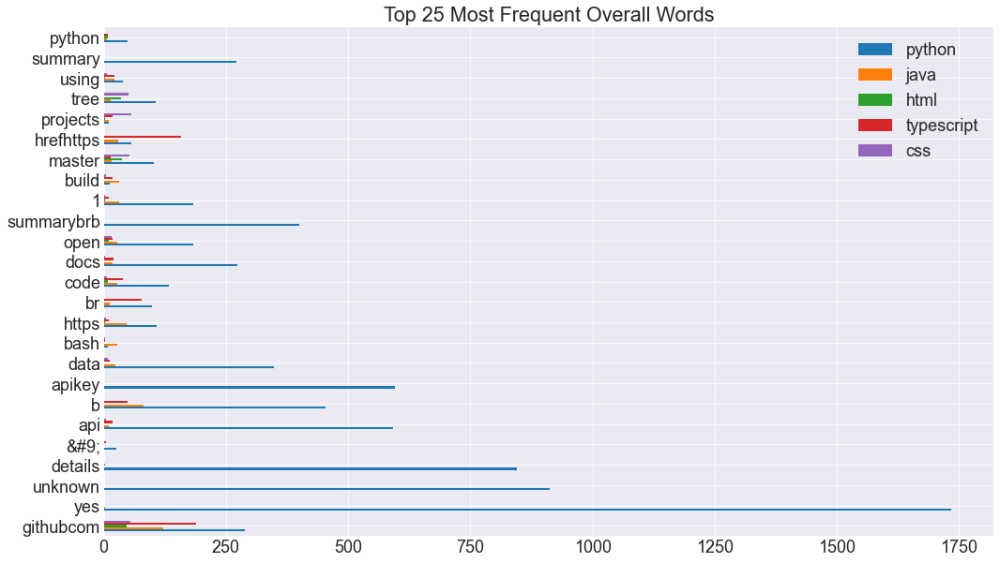

In [102]:
plt.rc('font', size=18)
word_counts.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall Words')

## Python words

<AxesSubplot:>

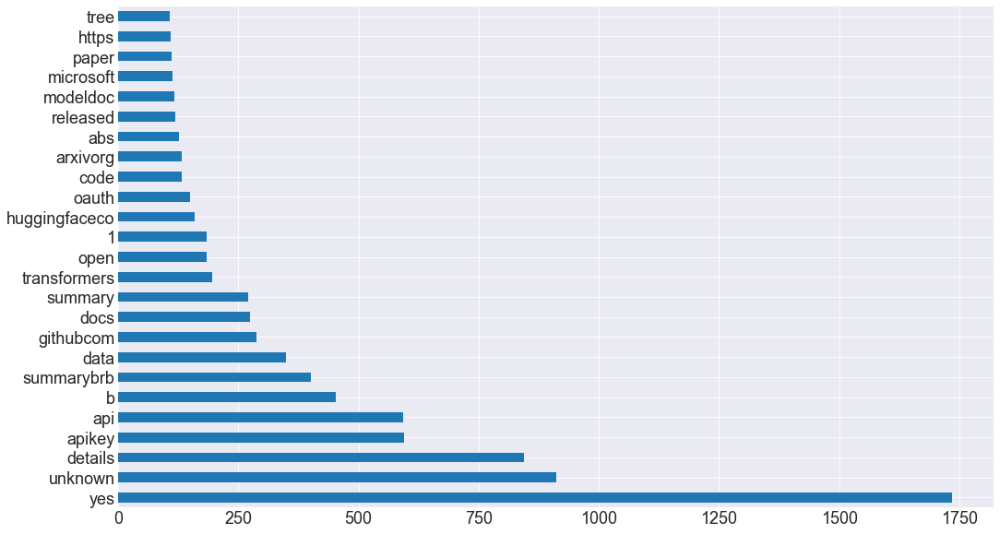

In [129]:
py_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

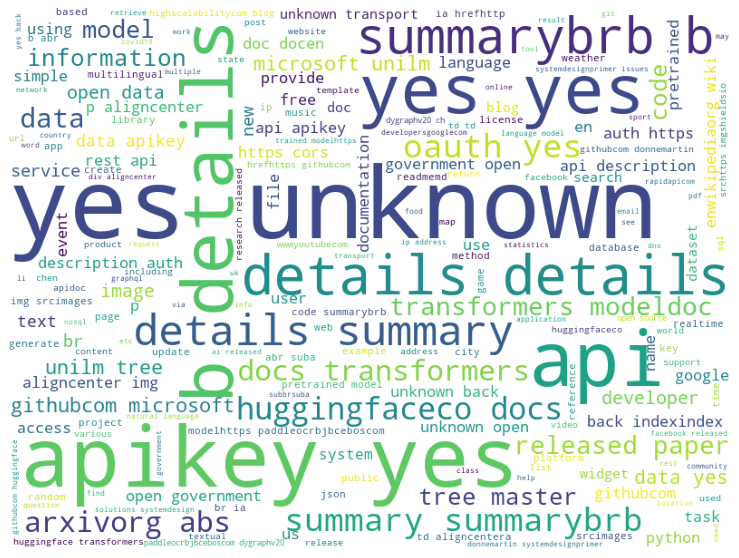

In [34]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

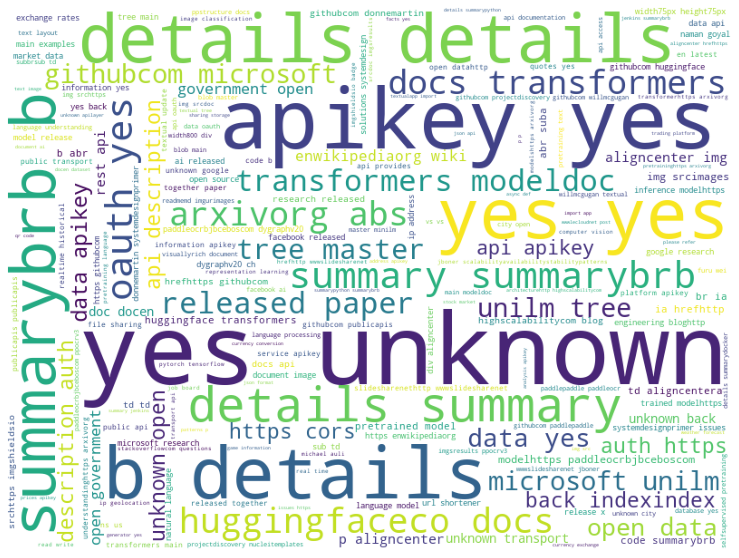

In [35]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

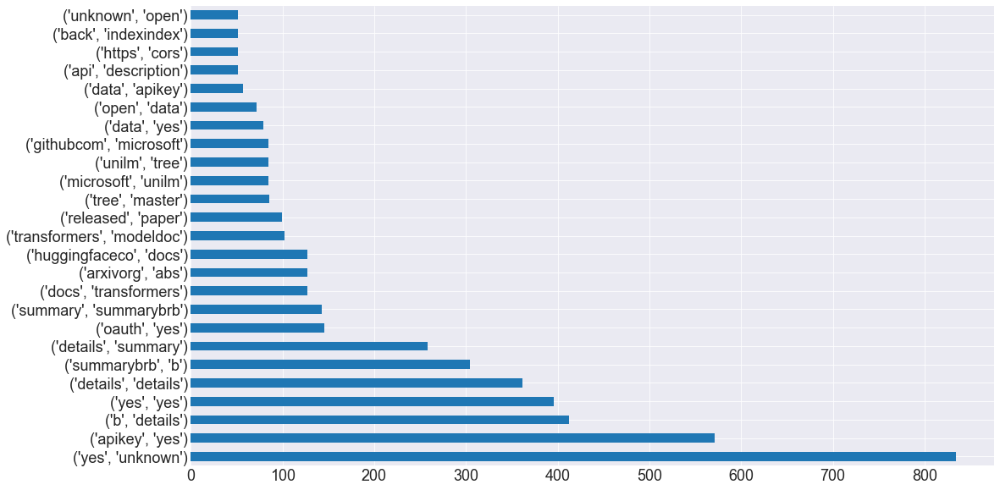

In [139]:
py_bigrams = (pd.Series((nltk.bigrams(py_words.split()))).astype('string'))
py_bigrams.value_counts().head(25).plot.barh()

## JavaScript Words

<AxesSubplot:>

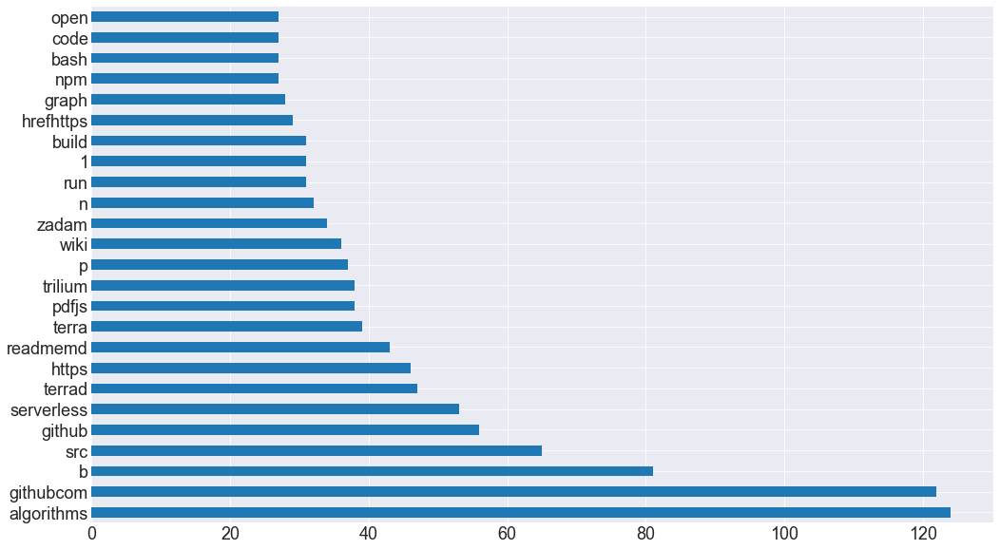

In [130]:
java_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

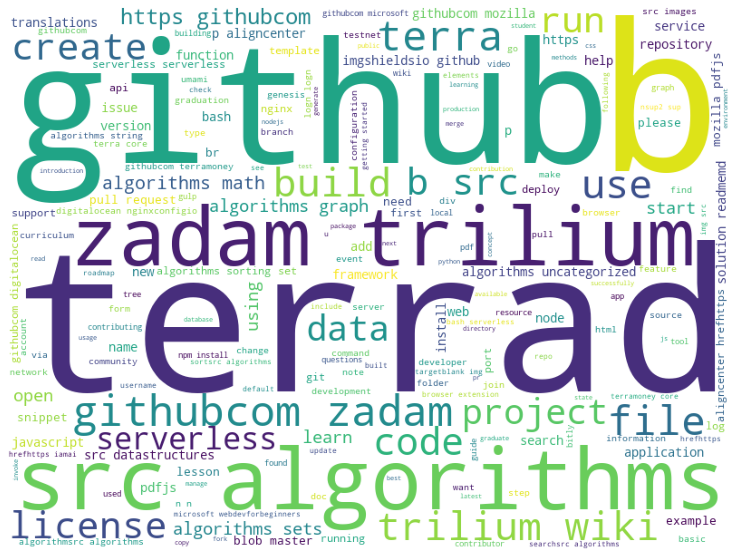

In [37]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

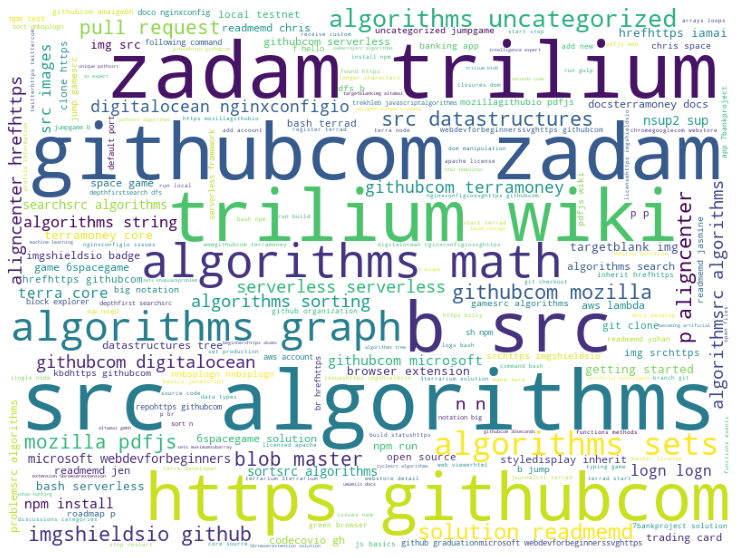

In [103]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

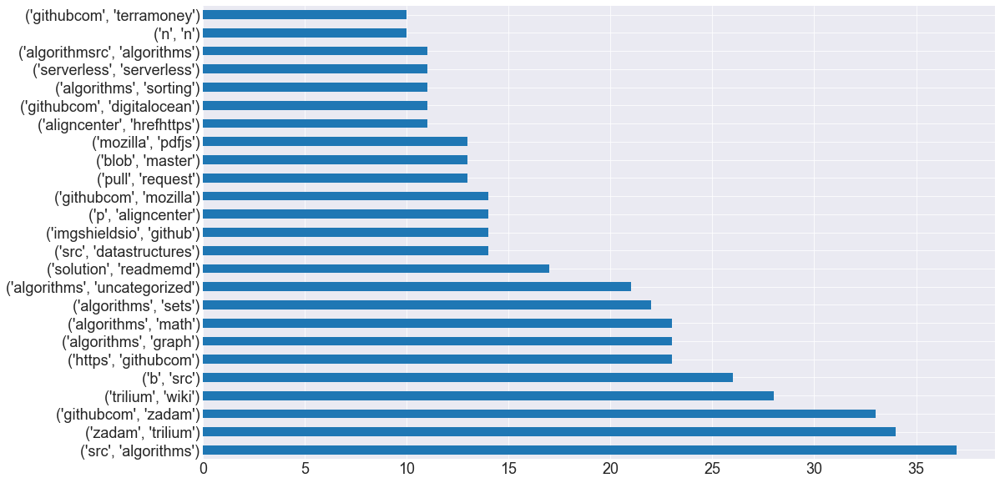

In [138]:
java_bigrams = (pd.Series((nltk.bigrams(java_words.split()))).astype('string'))
java_bigrams.value_counts().head(25).plot.barh()

## HTML Words

<AxesSubplot:>

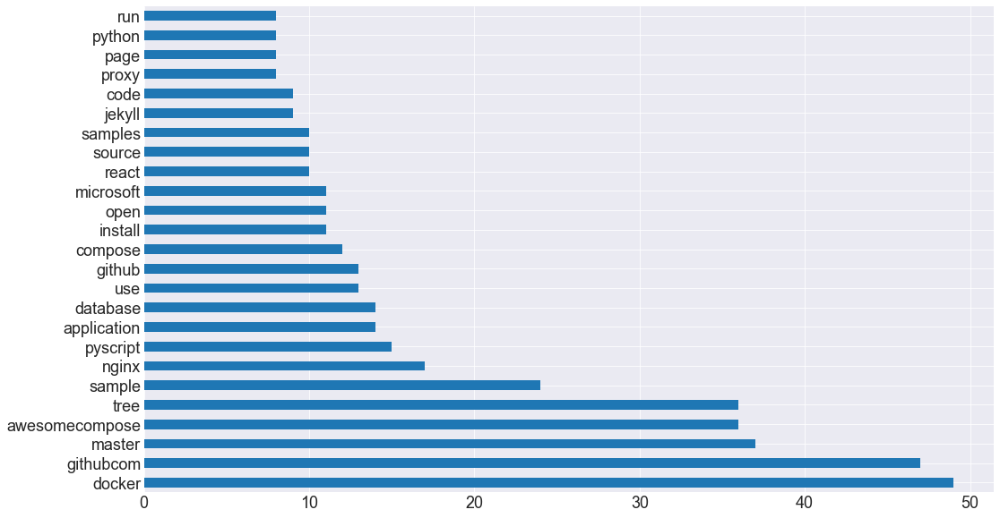

In [131]:
html_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

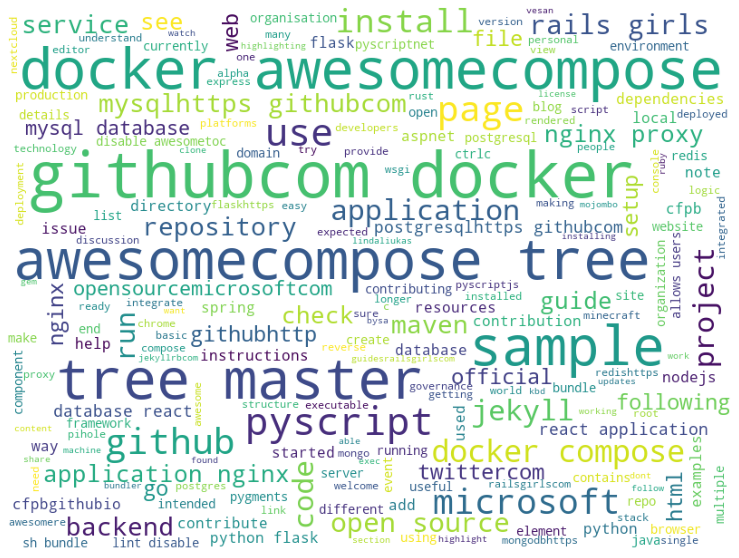

In [40]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

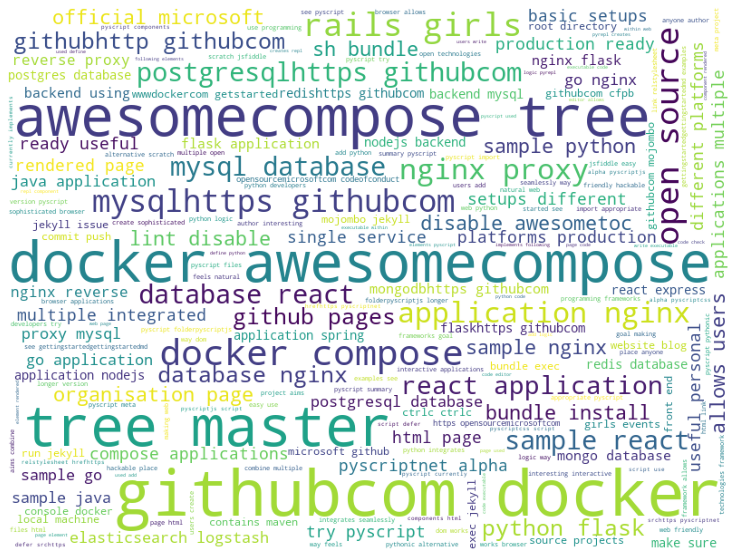

In [41]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

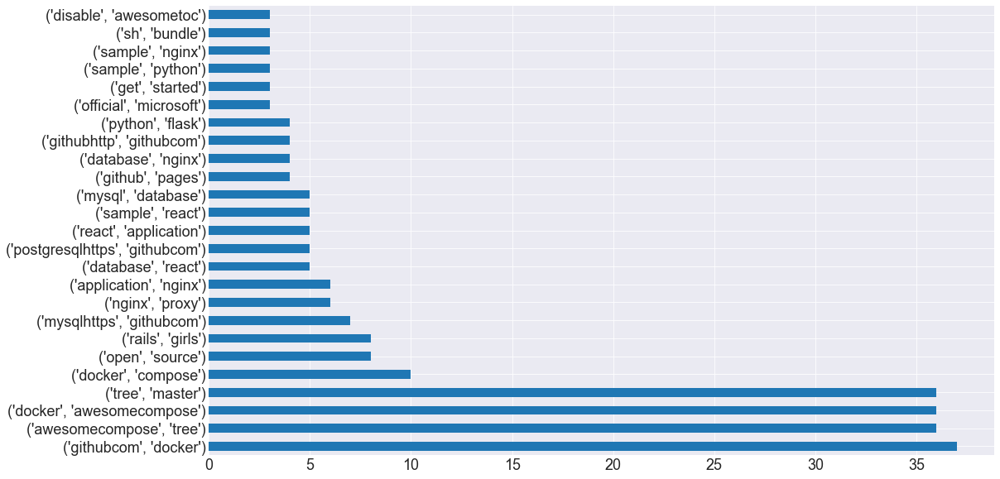

In [140]:
html_bigrams = (pd.Series((nltk.bigrams(html_words.split()))).astype('string'))
html_bigrams.value_counts().head(25).plot.barh()

## TypeScript Words

<AxesSubplot:>

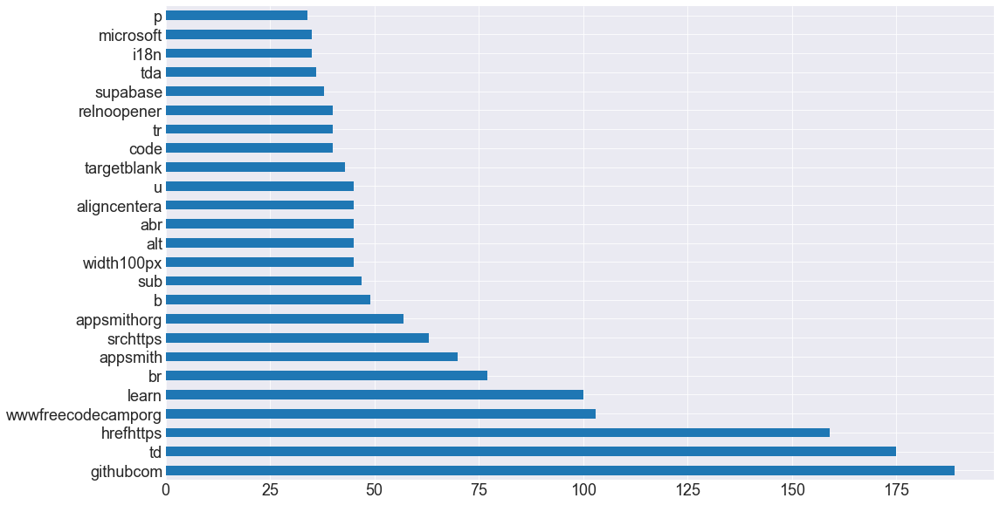

In [132]:
types_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

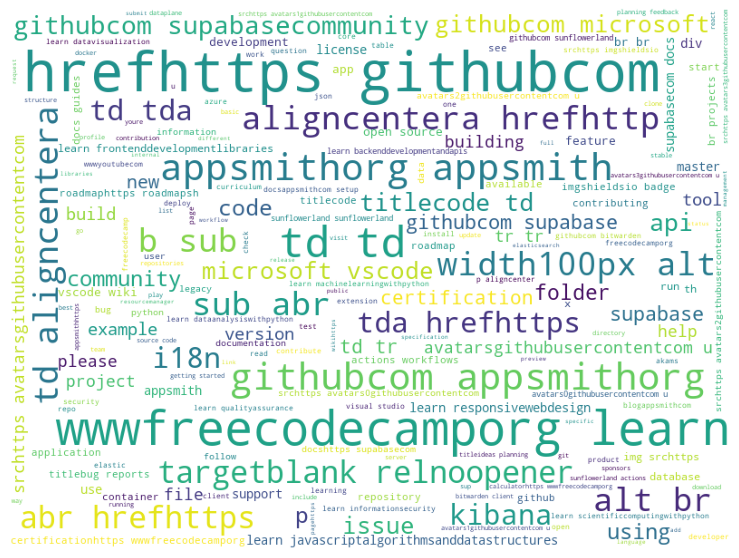

In [43]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

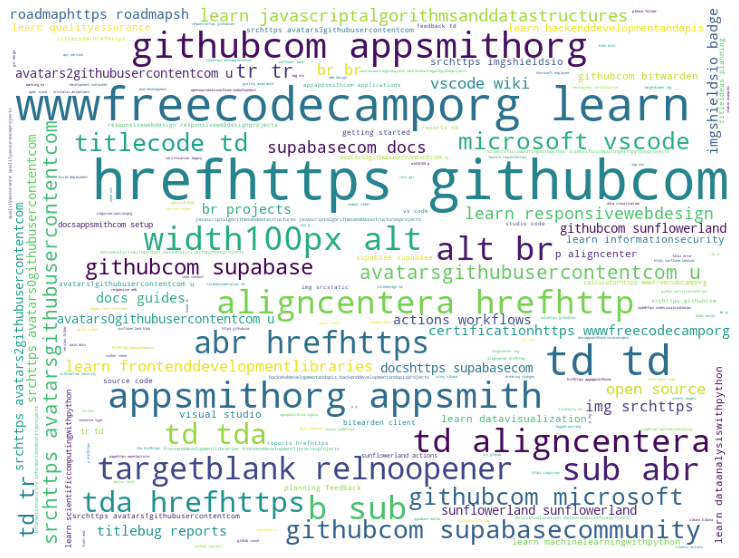

In [44]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

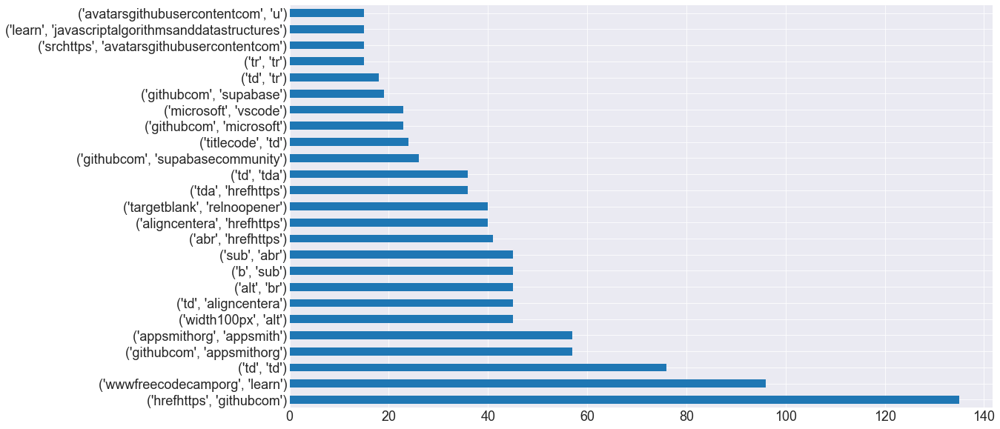

In [141]:
types_bigrams = (pd.Series((nltk.bigrams(types_words.split()))).astype('string'))
types_bigrams.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

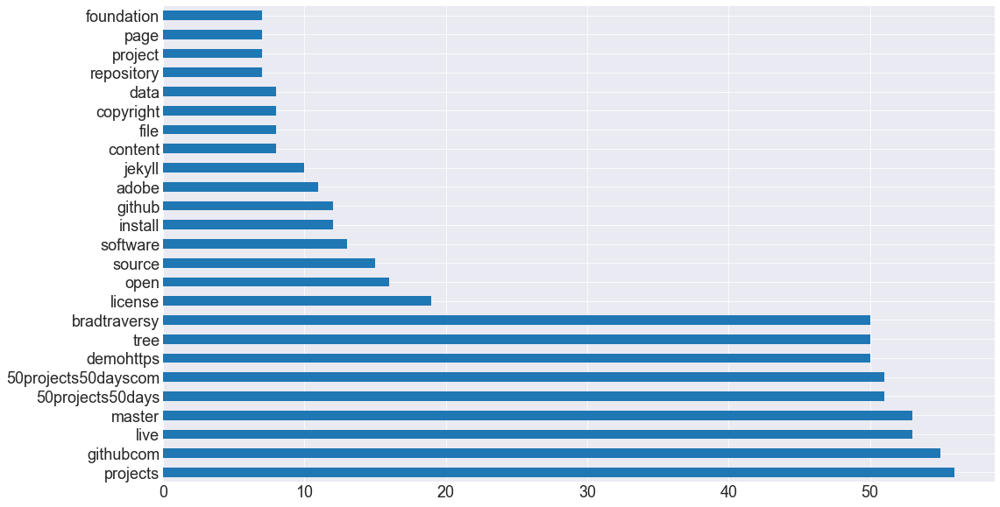

In [133]:
css_freq.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

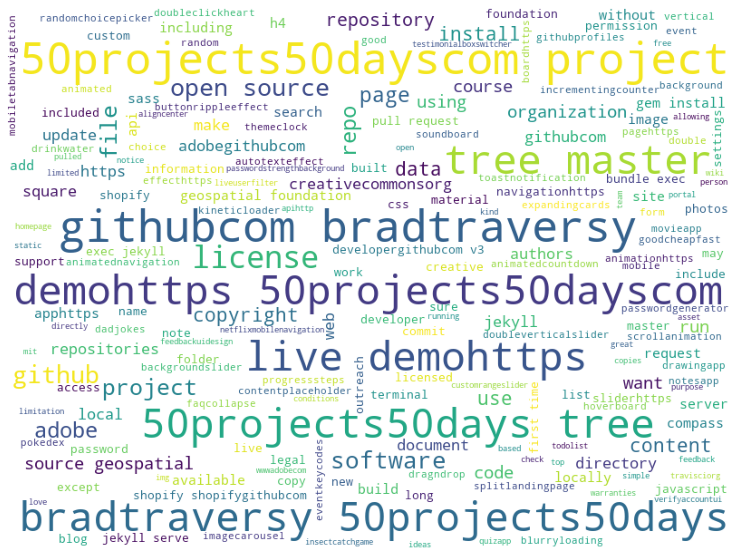

In [46]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

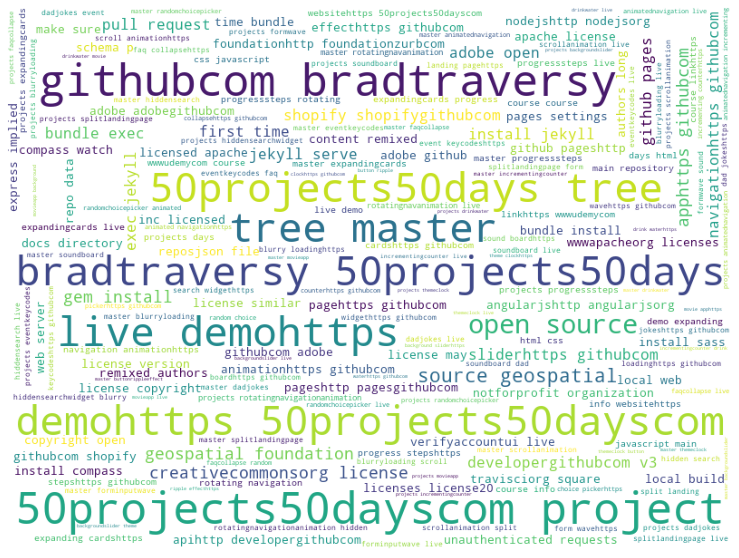

In [47]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

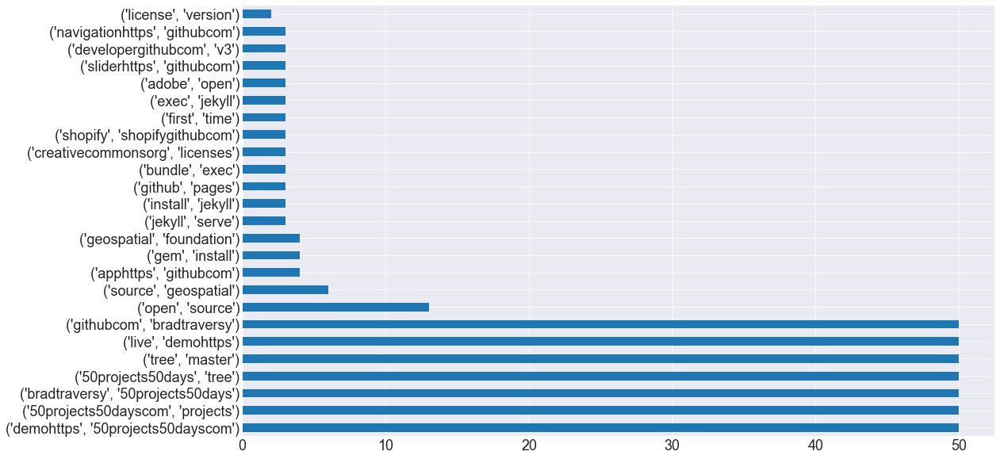

In [137]:
css_bigrams = (pd.Series((nltk.bigrams(css_words.split()))).astype('string'))
css_bigrams.value_counts().head(25).plot.barh()

#### Check the length of the readme

In [49]:
df['message_length'] = df.clean.apply(len)
df['word_count'] = df.clean.apply(str.split).apply(len)
df.head()

,repo,language,original,clean,stemmed,lemmatized,language_reduced,message_length,word_count
0,google/googletest,C++,# GoogleTest\n\n### Announcements\n\n#### Live...,googletest announcements live head googletest ...,googletest announc live head googletest follow...,googletest announcement live head googletest f...,Other,3542,410
1,projectdiscovery/nuclei-templates,Python,"\n\n<h1 align=""center"">\nNuclei Templates\n</h...",h1 aligncenter nuclei templates h1 h4 aligncen...,h1 aligncent nuclei templat h1 h4 aligncenterc...,h1 aligncenter nucleus template h1 h4 aligncen...,Python,3554,369
2,digitalocean/nginxconfig.io,JavaScript,[![GitHub stars](https://img.shields.io/github...,github starshttps imgshieldsio github stars di...,github starshttp imgshieldsio github star digi...,github starshttps imgshieldsio github star dig...,JavaScript,4582,483
3,flutter/flutter,Dart,# [![Flutter logo][]][flutter.dev]\n\n[![Build...,flutter logoflutterdev build status cirrusbuil...,flutter logoflutterdev build statu cirrusbuild...,flutter logoflutterdev build status cirrusbuil...,Other,4700,545
4,PaddlePaddle/PaddleOCR,Python,"English | [简体中文](README_ch.md)\n\n<p align=""ce...",english readmechmd p aligncenter img src doc p...,english readmechmd p aligncent img src doc pad...,english readmechmd p aligncenter img src doc p...,Python,10780,1151


In [105]:
round(df.message_length.mean(),2)

8928.46

In [ ]:
df.sort_values()

In [107]:
df[['message_length', 'word_count']][df.language == 'Python']

,message_length,word_count
1,3554,369
4,10780,1151
10,44561,5162
11,410,40
17,19701,2290
25,1342,147
52,334,41
53,2635,305
57,31164,4079
59,10,1


In [52]:
df[['message_length', 'word_count']][df.language == 'JavaScript']

,message_length,word_count
2,4582,483
13,11588,1360
22,4010,492
23,5171,567
27,5234,565
29,9576,1070
33,2577,276
69,1924,240
70,1353,172
82,4419,393


In [53]:
df[['message_length', 'word_count']][df.language == 'HTML']

,message_length,word_count
26,1518,180
38,5580,615
71,1953,250
91,1310,171
92,43,6
96,601,77
100,1405,139
103,0,0
106,25,3
108,0,0


In [54]:
df[['message_length', 'word_count']][df.language == 'TypeScript']

,message_length,word_count
5,9558,1069
12,3150,374
19,2592,318
39,2374,270
41,19148,1822
43,5182,551
54,5872,418
73,15886,1216
81,2988,334


In [55]:
df[['message_length', 'word_count']][df.language == 'CSS']

,message_length,word_count
68,8745,861
89,2140,264
94,1741,220
98,1848,235
102,2189,256
104,166,19
105,164,25
107,0,0


## Lemmatized

In [56]:
py_words_l = ' '.join(df[df.language == 'Python'].lemmatized)
java_words_l = ' '.join(df[df.language == 'JavaScript'].lemmatized)
html_words_l = ' '.join(df[df.language == 'HTML'].lemmatized)
types_words_l = ' '.join(df[df.language == 'TypeScript'].lemmatized)
css_words_l = ' '.join(df[df.language == 'CSS'].lemmatized)
all_words_l = ' '.join(df.lemmatized)

In [57]:
py_words_l[:1000]

'h1 aligncenter nucleus template h1 h4 aligncentercommunity curated list template nucleus engine find security vulnerability application h4 p aligncenter hrefhttps githubcom projectdiscovery nucleitemplates issuesimg srchttps imgshieldsio badge contributionswelcomebrightgreensvgstyleflat hrefhttps githubcom projectdiscovery nucleitemplates releasesimg srchttps imgshieldsio github release projectdiscovery nucleitemplates hrefhttps twittercom pdnucleiimg srchttps imgshieldsio twitter follow pdnucleisvglogotwitter hrefhttps discordgg projectdiscoveryimg srchttps imgshieldsio discord 695645237418131507svglogodiscord p p aligncenter hrefhttps nucleiprojectdiscoveryio templatingguide documentation hrefcontributionscontributions hrefdiscussiondiscussion hrefcommunitycommunity hrefhttps nucleiprojectdiscoveryio faq template faq hrefhttps discordgg projectdiscoveryjoin discord p template core nucleus scannerhttps githubcom projectdiscovery nucleus power actual scanning engine repository store h

In [58]:
java_words_l[:1000]

'github starshttps imgshieldsio github star digitalocean nginxconfigiosvghttps githubcom digitalocean nginxconfigio stargazer github contributorshttps imgshieldsio github contributor digitalocean nginxconfigiosvgcolorbluehttps githubcom digitalocean nginxconfigio graph contributor mit licensehttps imgshieldsio github license digitalocean nginxconfigiosvgcolorbluehttps githubcom digitalocean nginxconfigio blob master license br closed issueshttps imgshieldsio github issuesclosedraw digitalocean nginxconfigiosvgcolorbrightgreenhttps githubcom digitalocean nginxconfigio issuesqis3aissueis3aclosed closed prhttps imgshieldsio github issuesprclosedraw digitalocean nginxconfigiosvgcolorbrightgreenhttps githubcom digitalocean nginxconfigio pullsqis3apris3aclosed open issueshttps imgshieldsio github issuesraw digitalocean nginxconfigiosvghttps githubcom digitalocean nginxconfigio issue open prhttps imgshieldsio github issuesprraw digitalocean nginxconfigiosvghttps githubcom digitalocean nginxco

In [59]:
html_words_l[:1000]

'pyscript pyscript summary pyscript pythonic alternative scratch jsfiddle easy use programming framework goal making web friendly hackable place anyone author interesting interactive application get started see gettingstartedgettingstartedmd example see pyscript folderpyscriptjs longer version pyscript meta project aim combine multiple open technology framework allows user create sophisticated browser application python integrates seamlessly way dom work browser allows user add python logic way feel natural web python developer try pyscript try pyscript import appropriate pyscript file html page html link relstylesheet hrefhttps pyscriptnet alpha pyscriptcss script defer srchttps pyscriptnet alpha pyscriptjs script use pyscript component html page pyscript currently implement following element pyscript used define python code executable within web page element rendered page used add logic pyrepl creates repl component rendered page code editor allows user write executable code check py

In [60]:
types_words_l[:1000]

'p aligncenter img width300 srchttps rawgithubusercontentcom supabase supabase master web static supabaselightroundedcornerbackgroundsvg p supabase supabasehttps supabasecom open source firebase alternative building feature firebase using enterprisegrade open source tool x hosted postgres database docshttps supabasecom doc guide database x authentication authorization docshttps supabasecom doc guide auth x autogenerated apis x rest docshttps supabasecom doc guide apirestapi x realtime subscription docshttps supabasecom doc guide apirealtimeapi x graphql beta docshttps supabasecom doc guide apigraphqlapi x function x database function docshttps supabasecom doc guide database function x edge function docshttps supabasecom doc guide function x file storage docshttps supabasecom doc guide storage x dashboard supabase dashboardhttps rawgithubusercontentcom supabase supabase master apps www public image github supabasedashboardpng documentation full documentation visit supabasecom docshttps 

In [61]:
css_words_l[:1000]

'50 project 50 day html cs javascript main repository project course course linkhttps wwwudemycom course 50projects50days course info websitehttps 50projects50dayscom project live demo 01 expanding cardshttps githubcom bradtraversy 50projects50days tree master expandingcards live demohttps 50projects50dayscom project expandingcards 02 progress stepshttps githubcom bradtraversy 50projects50days tree master progresssteps live demohttps 50projects50dayscom project progresssteps 03 rotating navigation animationhttps githubcom bradtraversy 50projects50days tree master rotatingnavanimation live demohttps 50projects50dayscom project rotatingnavigationanimation 04 hidden search widgethttps githubcom bradtraversy 50projects50days tree master hiddensearch live demohttps 50projects50dayscom project hiddensearchwidget 05 blurry loadinghttps githubcom bradtraversy 50projects50days tree master blurryloading live demohttps 50projects50dayscom project blurryloading 06 scroll animationhttps githubcom b

In [62]:
all_words_l[:1000]

'googletest announcement live head googletest follows abseil live head philosophyhttps abseilio philosophyupgradesupport recommend updating latest commit main branch often possiblehttps githubcom abseil abseilcpp blob master faqmdwhatisliveatheadandhowdoidoit documentation update documentation live github page http googlegithubio googletest recommend browsing documentation github page rather directly repository release 1110 release 1110https githubcom google googletest release tag release1110 available coming soon planning take dependency abseilhttps githubcom abseil abseilcpp documentation improvement planned welcome googletest google c test framework repository merger formerly separate googletest googlemock project closely related make sense maintain release together getting started see googletest user guidehttps googlegithubio googletest documentation recommend starting googletest primerhttps googlegithubio googletest primerhtml information building googletest found googletest readm

In [63]:
py_freq_l = pd.Series(py_words_l.split()).value_counts()
java_freq_l = pd.Series(java_words_l.split()).value_counts()
html_freq_l = pd.Series(html_words_l.split()).value_counts()
types_freq_l = pd.Series(types_words_l.split()).value_counts()
css_freq_l = pd.Series(css_words_l.split()).value_counts()
all_freq_l = pd.Series(all_words_l.split()).value_counts()


In [64]:
py_freq_l

yes                      1734
unknown                   912
detail                    846
apikey                    595
api                       592
                         ... 
elblistenerconfightml       1
elasticloadbalancing        1
confighttp                  1
listener                    1
mitlicense                  1
Length: 10543, dtype: int64

In [65]:
java_freq_l

algorithm     124
githubcom     122
b              81
src            65
http           59
             ... 
onboarding      1
existing        1
select          1
scratch         1
file2           1
Length: 2486, dtype: int64

In [66]:
html_freq_l

docker            49
githubcom         47
master            37
awesomecompose    36
tree              36
                  ..
desktophttps       1
friendly           1
macos              1
window             1
didi               1
Length: 628, dtype: int64

In [67]:
types_freq_l

githubcom                                       189
td                                              175
hrefhttps                                       159
wwwfreecodecamporg                              103
learn                                           100
                                               ... 
watchvtisuaigi86k                                 1
buildinganadminpanelwithmongodbusingappsmith      1
panel                                             1
admin                                             1
detail                                            1
Length: 2213, dtype: int64

In [68]:
css_freq_l

project             63
githubcom           55
master              53
live                53
50projects50days    51
                    ..
rock                 1
watching             1
order                1
popularity           1
need                 1
Length: 829, dtype: int64

In [69]:
all_freq_l

githubcom        2175
yes              1764
unknown           913
detail            884
&#9;              739
                 ... 
vincent             1
keycodeshttps       1
segonne             1
maximin             1
didi                1
Length: 26743, dtype: int64

In [70]:
word_counts_l = pd.concat([py_freq_l, java_freq_l, html_freq_l, types_freq_l, css_freq_l, all_freq_l], axis=1).fillna(0).astype(int)
word_counts_l.columns = ['python', 'java', 'html', 'typescript', 'css', 'all']

In [71]:
word_counts_l

,python,java,html,typescript,css,all
yes,1734,2,0,0,0,1764
unknown,912,0,0,0,0,913
detail,846,4,3,1,0,884
apikey,595,0,0,0,0,595
api,592,11,0,18,4,703
...,...,...,...,...,...,...
suitable,0,0,0,0,0,1
finishing,0,0,0,0,0,1
quickstarts,0,0,0,0,0,1
v2version,0,0,0,0,0,1


In [121]:
word_counts_l.sort_values('python', ascending=False).head(25)

,python,java,html,typescript,css,all
yes,1734,2,0,0,0,1764
unknown,912,0,0,0,0,913
detail,846,4,3,1,0,884
apikey,595,0,0,0,0,595
api,592,11,0,18,4,703
b,453,81,0,49,1,658
summarybrb,400,0,0,0,0,400
data,349,24,0,13,8,582
doc,328,19,1,20,2,480
githubcom,288,122,47,189,55,2175


In [73]:
word_counts_l.sort_values('java', ascending=False).head(25)

,python,java,html,typescript,css,all
algorithm,11,124,0,4,0,157
githubcom,288,122,47,189,55,2175
b,453,81,0,49,1,658
src,7,65,0,3,0,113
http,184,59,9,11,8,686
github,19,56,13,13,12,236
serverless,0,53,0,0,0,64
terrad,0,47,0,0,0,47
readmemd,38,43,1,3,1,156
set,12,40,1,4,1,126


In [74]:
word_counts_l.sort_values('html', ascending=False).head(25)

,python,java,html,typescript,css,all
docker,27,5,49,6,0,142
githubcom,288,122,47,189,55,2175
master,102,18,37,14,53,348
tree,107,14,36,1,50,279
awesomecompose,0,0,36,0,0,36
sample,5,2,34,1,0,58
application,16,16,20,15,0,170
nginx,3,12,17,0,0,35
pyscript,0,0,15,0,0,15
database,28,6,14,11,0,103


In [75]:
word_counts_l.sort_values('typescript', ascending=False).head(25)

,python,java,html,typescript,css,all
githubcom,288,122,47,189,55,2175
td,50,0,0,175,0,238
hrefhttps,56,29,1,159,0,315
wwwfreecodecamporg,0,0,0,103,0,105
learn,6,22,1,100,1,203
br,99,13,0,77,0,480
appsmith,0,0,0,70,0,72
srchttps,32,10,1,63,1,177
appsmithorg,0,0,0,57,0,59
u,54,7,1,52,2,162


In [76]:
word_counts_l.sort_values('css', ascending=False).head(25)

,python,java,html,typescript,css,all
project,30,24,9,25,63,455
githubcom,288,122,47,189,55,2175
master,102,18,37,14,53,348
live,13,1,0,2,53,79
50projects50days,0,0,0,0,51,51
50projects50dayscom,0,0,0,0,51,51
bradtraversy,0,0,0,0,50,50
demohttps,0,0,0,0,50,50
tree,107,14,36,1,50,279
license,27,29,2,14,25,182


In [77]:
# set up some basic matplotlib style parameters
plt.rc('figure', figsize=(17, 10))
plt.style.use('seaborn-darkgrid')

Text(0.5, 1.0, 'Top 25 Most Frequent Overall lemmatized Words')

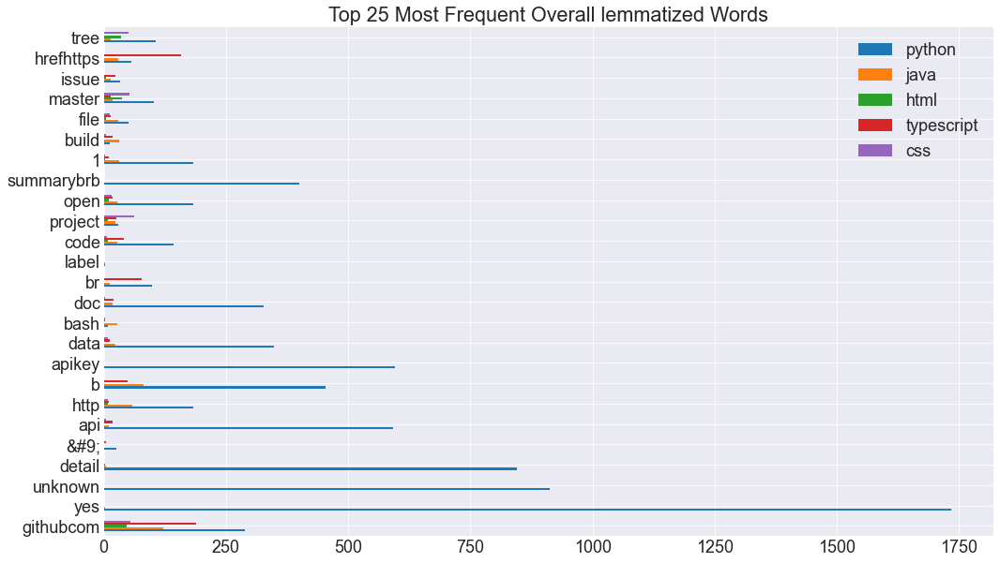

In [78]:
plt.rc('font', size=18)
word_counts_l.sort_values('all', ascending=False).head(25)[['python', 'java', 'html', 'typescript', 'css']].plot.barh()
plt.title('Top 25 Most Frequent Overall lemmatized Words')

## Lemmatized Python words

<AxesSubplot:>

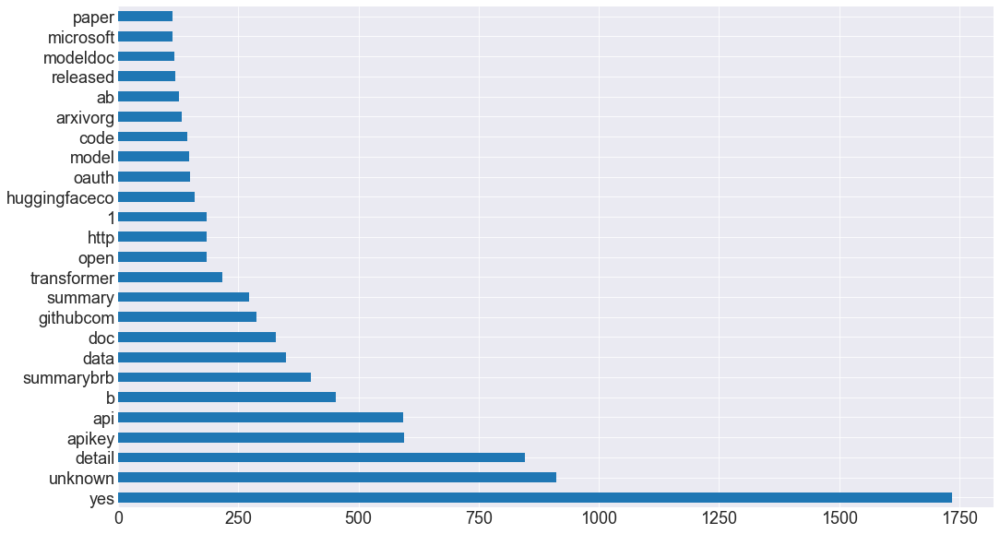

In [142]:
py_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

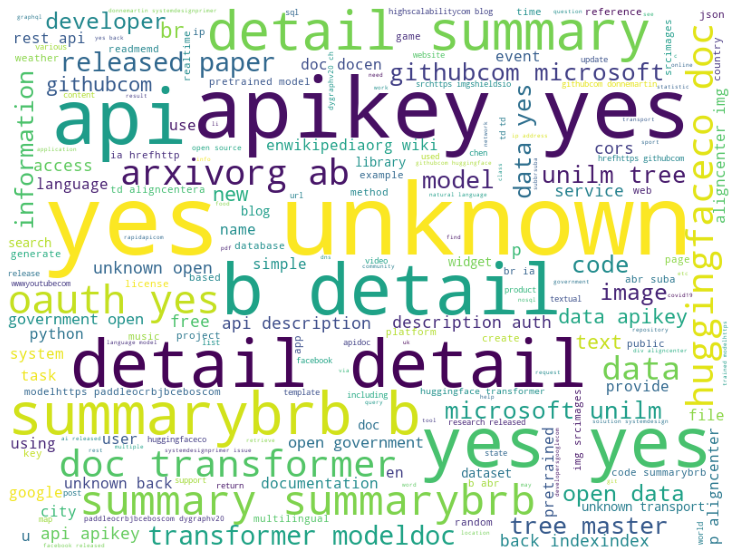

In [79]:
img = WordCloud(background_color='white', width=800, height=600).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

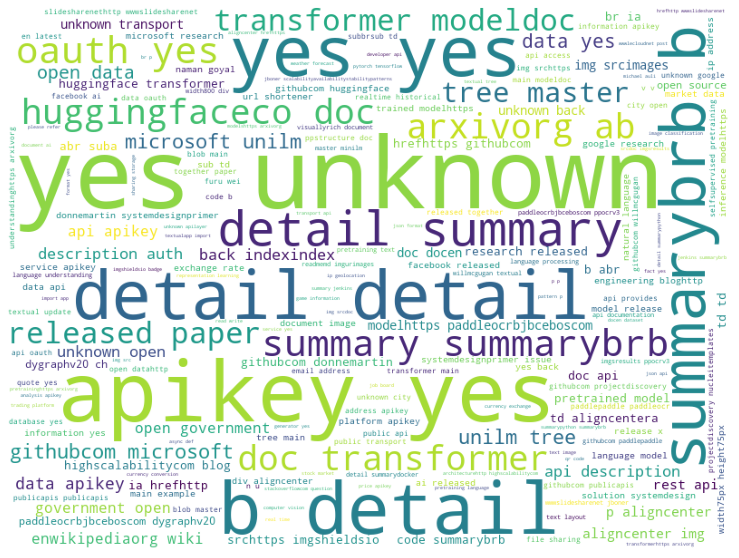

In [80]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(py_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

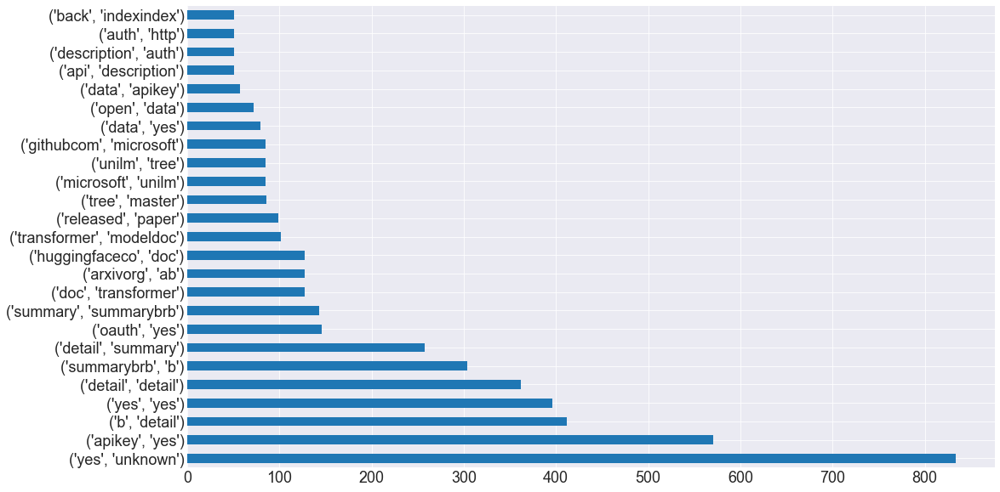

In [143]:
py_bigrams_l = (pd.Series((nltk.bigrams(py_words_l.split()))).astype('string'))
py_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized JavaScript Words

<AxesSubplot:>

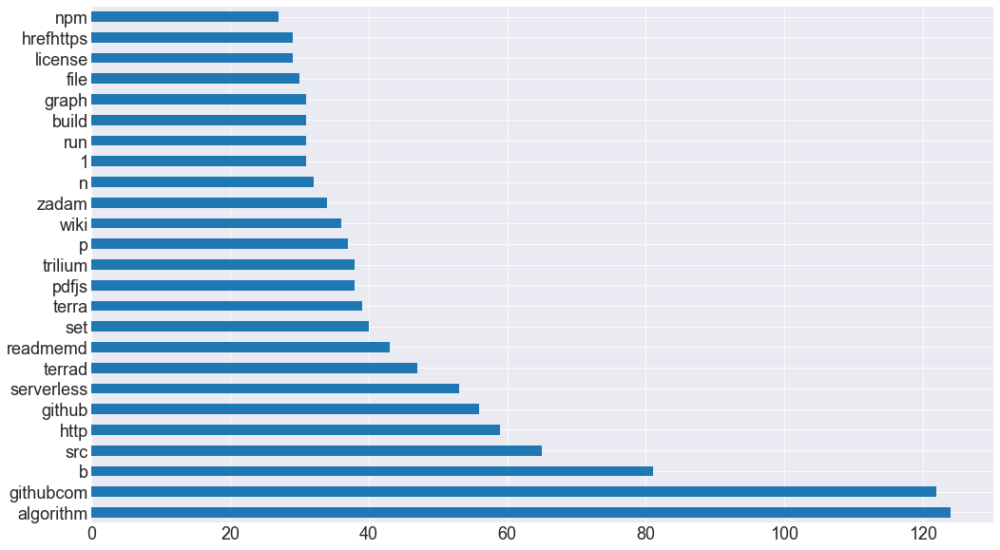

In [144]:
java_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

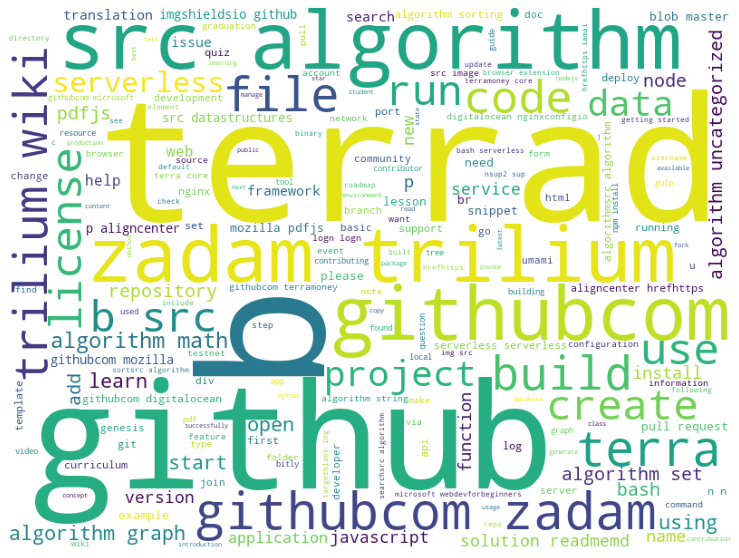

In [82]:
img = WordCloud(background_color='white', width=800, height=600).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

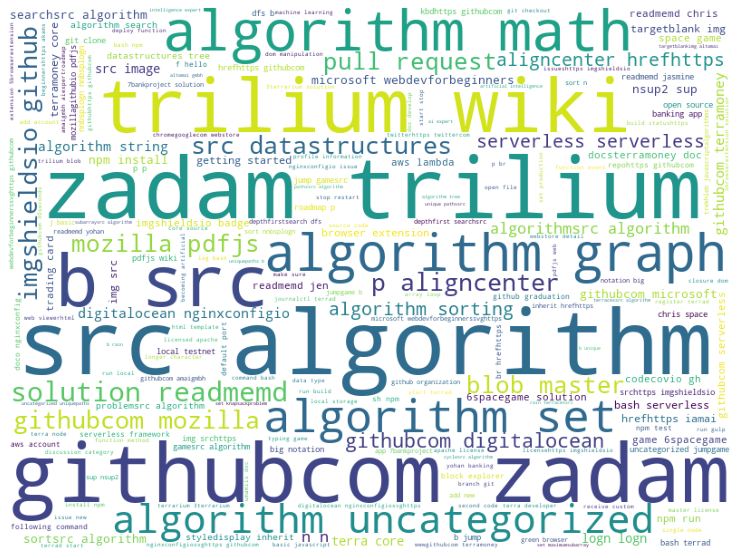

In [83]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(java_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

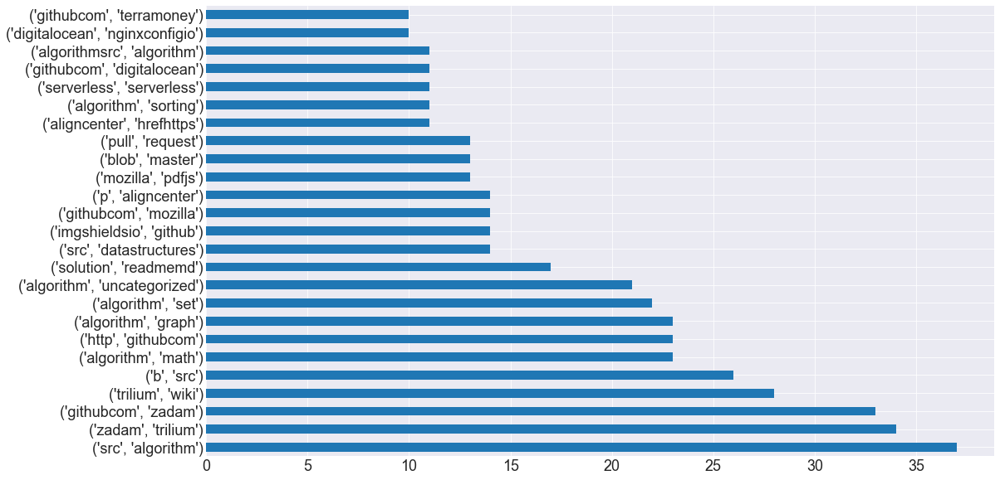

In [145]:
java_bigrams_l = (pd.Series((nltk.bigrams(java_words_l.split()))).astype('string'))
java_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized HTML Words

<AxesSubplot:>

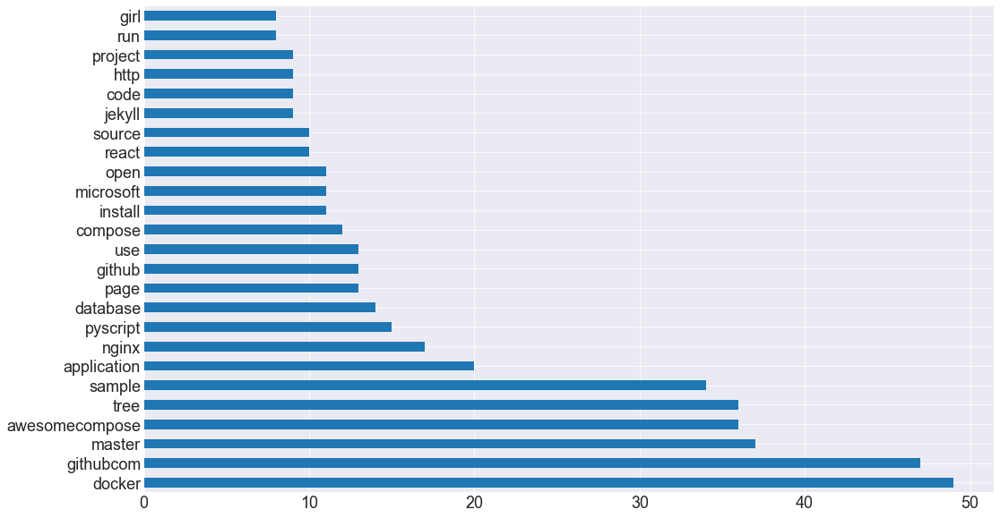

In [146]:
html_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

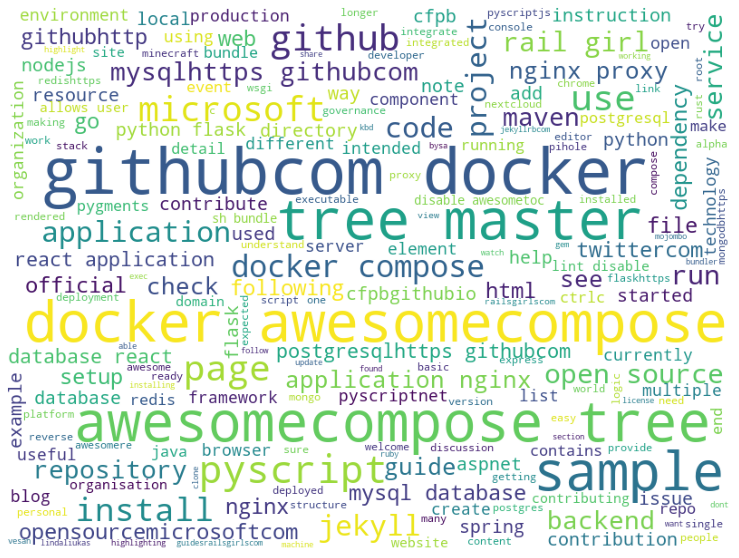

In [85]:
img = WordCloud(background_color='white', width=800, height=600).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

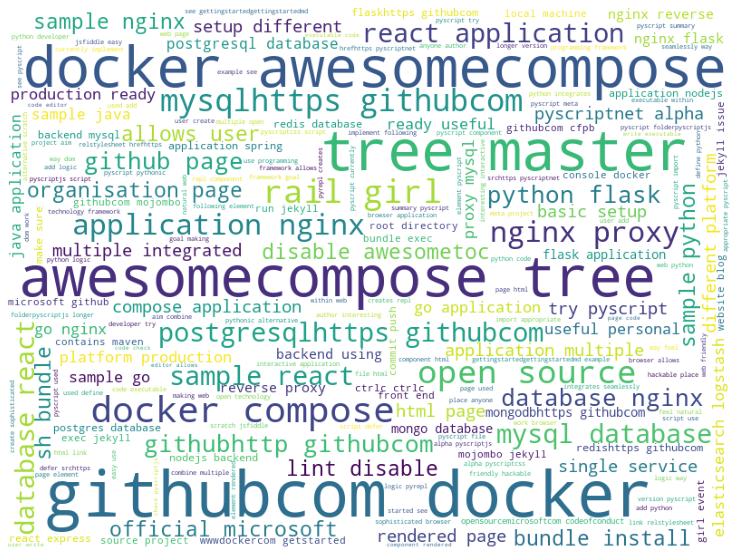

In [86]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(html_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

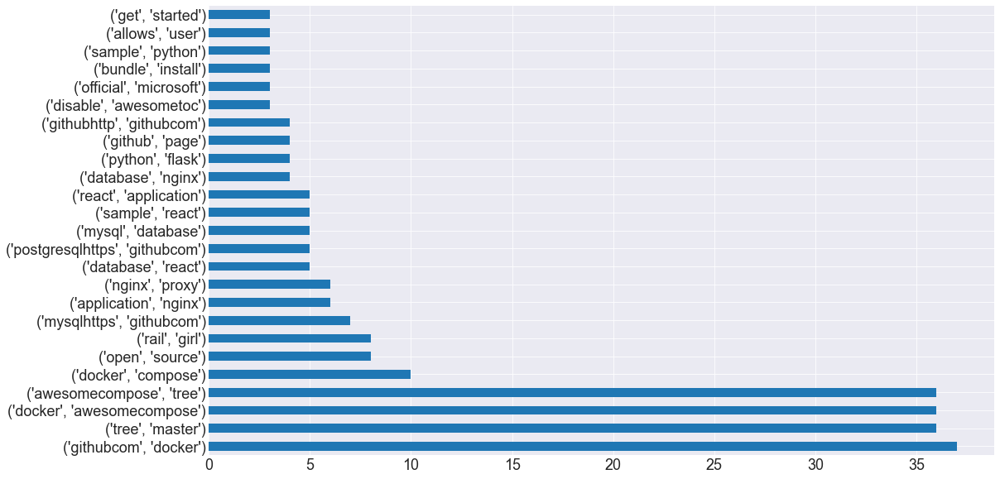

In [147]:
html_bigrams_l = (pd.Series((nltk.bigrams(html_words_l.split()))).astype('string'))
html_bigrams_l.value_counts().head(25).plot.barh()

## Lemmatized TypeScript Words

<AxesSubplot:>

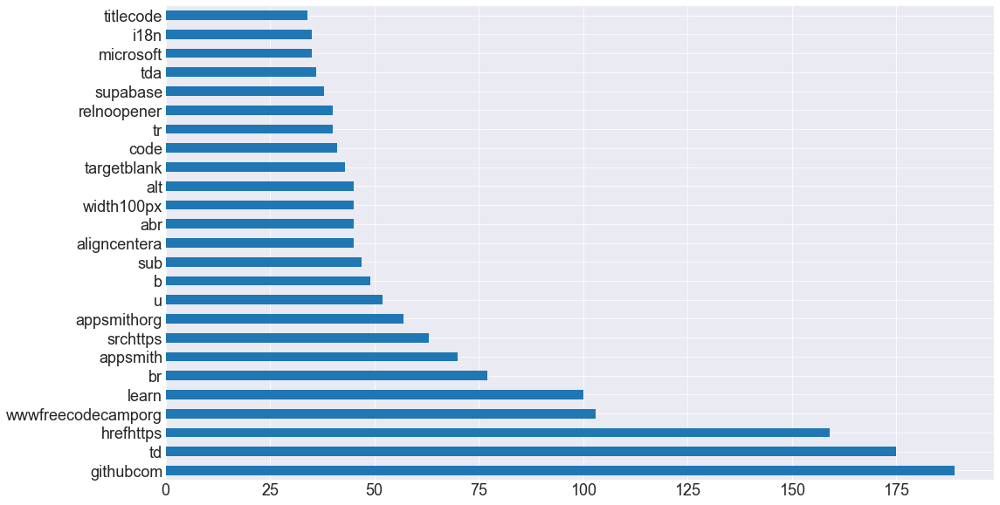

In [148]:
types_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

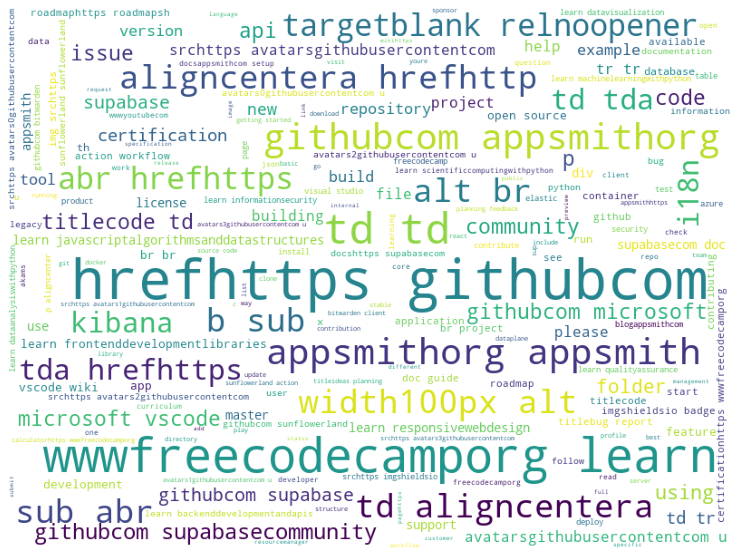

In [88]:
img = WordCloud(background_color='white', width=800, height=600).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

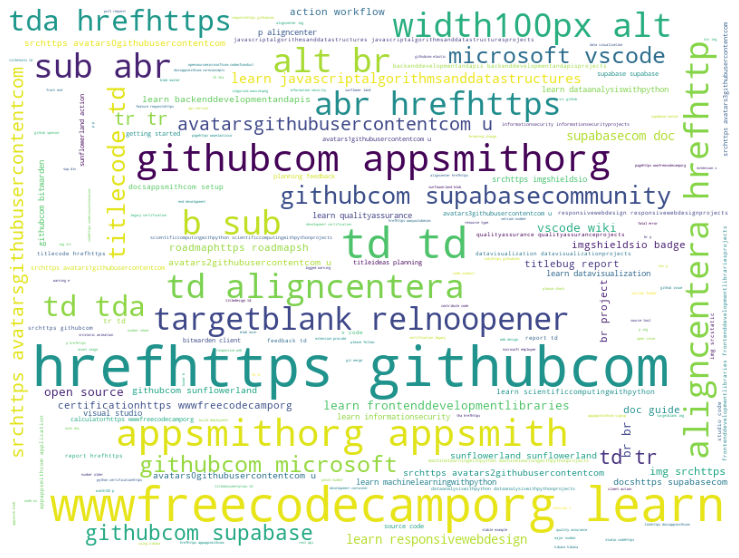

In [89]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(types_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

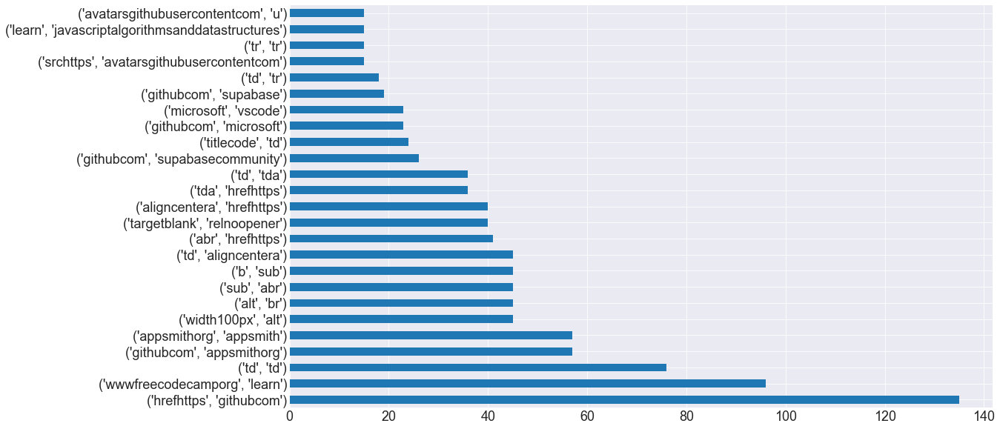

In [149]:
types_bigrams_l = (pd.Series((nltk.bigrams(types_words_l.split()))).astype('string'))
types_bigrams_l.value_counts().head(25).plot.barh()

## CSS Words

<AxesSubplot:>

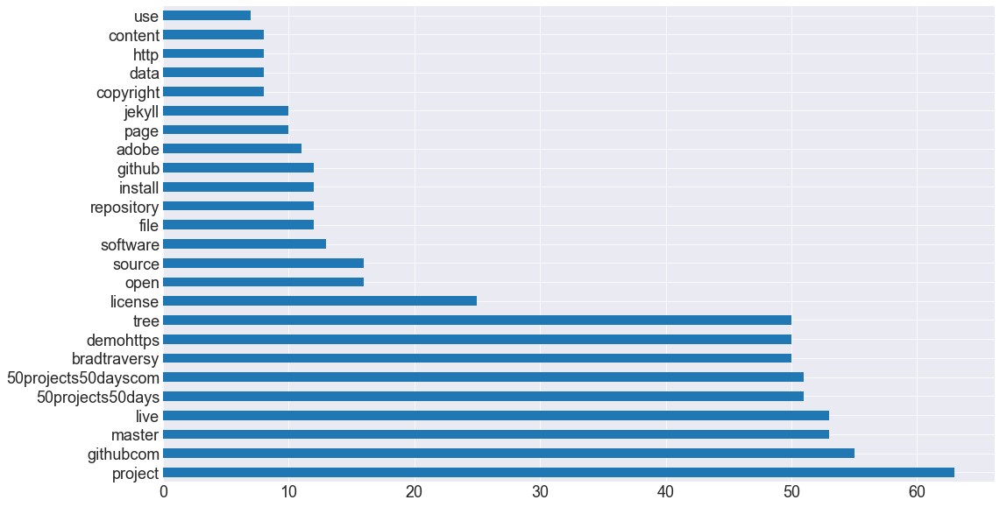

In [150]:
css_freq_l.head(25).plot.barh()

(-0.5, 799.5, 599.5, -0.5)

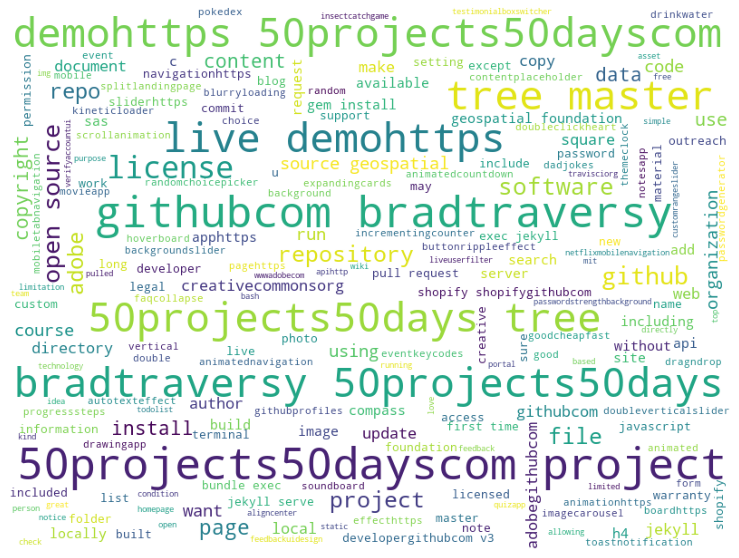

In [91]:
img = WordCloud(background_color='white', width=800, height=600).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

(-0.5, 799.5, 599.5, -0.5)

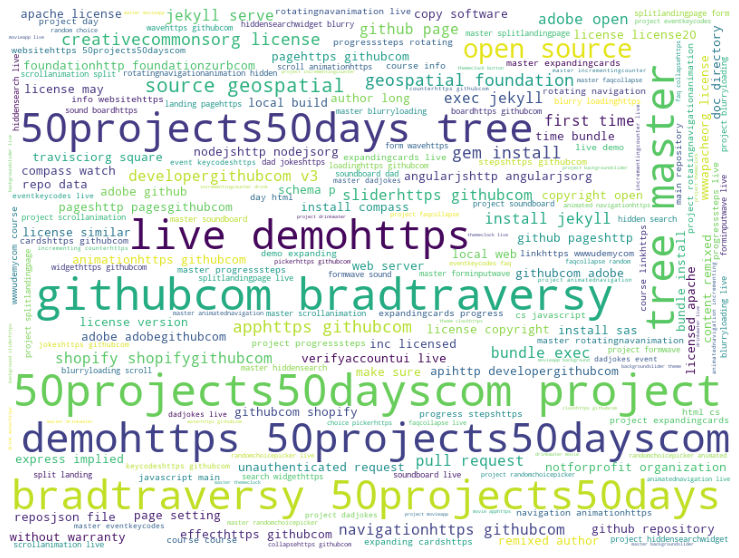

In [92]:
img = WordCloud(background_color='white', width=800, height=600, collocation_threshold=3).generate(css_words_l)
plt.imshow(img)
plt.axis('off')

<AxesSubplot:>

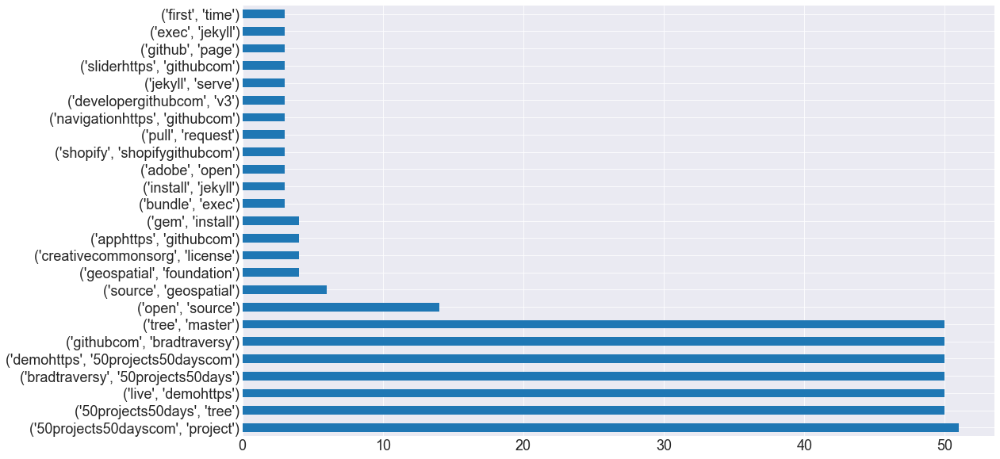

In [151]:
css_bigrams_l = (pd.Series((nltk.bigrams(css_words_l.split()))).astype('string'))
css_bigrams_l.value_counts().head(25).plot.barh()